<a href="https://colab.research.google.com/github/djbradyAtOpticalSciencesArizona/multiframeEstimation/blob/main/maximum_noise_reduction_explanation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Maximum Noise Reduction Sampling Explanation
 - Ultimate goal
 - Ideal environment
 - Noise model
 - Simple frame fusion: weighted average
 - New frame reduces uncertainty (noise)
 - Maximum noise reduction strategy
 - Example
 - Complex frame fusion: maximum likelihood estimation / Bayesian inference

## Ultimate goal: camaraman and darkroom

We want to develop an algorithm to smartly capture and process videos, aiming to give better video than SOTA methods. The problem is two fold: a ***cameraman*** giving a capturing policy, and a ***darkroom*** to process captured frames into displayable videos. 

Both algorithms would be NN based. For the darkroom part, it's a easy-forward-hard-backward problem, and NN has shown compelling performance in multi-frame fusing and image/video generation. For the cameraman part, if the darkroom is NN, the no way to optimize the cameraman without NN. Meanwhile, the cameraman's policy finding nature fits RL.

Most existing methods focus on the post-process part, while few, as far as I know, tried to maniplate the capturing process. That can be a breakthrough.

Many parameters of the capturing process can be controlled, including area of interest, focus, exposure, etc. Here we focus on the exposure part to make some quick results and a quick paper.

## Ideal environment

Before we dive into the NN part, we can take one step back, and look into a simple, ideal environment, where methematical analyse works. Through this, we can learn how these two parts, especially the cameraman part, should work. We can then evaluate, explain, or regulate our NN policy maker with the principles we find.

The assumptions are:
 - Static scene. Thus, the alignment problem vanishes, and the darkroom will be pretty simple. The final output is simple, too, which is just an image. 
 - No limit to total exposure time. The goal is to eliminate defects in the fastest manner. (1)
 - The response of a pixel is a random variable, and we know its distribution if its normalized ideal response (NIR) and exposure time are given. (2)
 - Before we read the captured frame, the NIR of a pixel is a random variable, and we know its distribution. (3)
 
**Note (1): unlimited time**   
Why don't we assume a limited exposure time, like 1/30 seconds? For a real, static scene, we continuously take frames for minutes, long enough compared to exposure time (~0.01s). The problem is not that we need to capture some frames to produce one frame within a specific time. The problem is to capture frames so we can keep pace with the varying scene, while maintaining a good image quality.

**Note (2): normalized ideal response (NIR)**   
For NIR, "ideal" means that the value is given by an ideal pixel, and "normalized" means that the pixel is exposed to current intensity for a unit time. The ideal pixel acts like the real pixel, but has no noise nor upper limit. The unit time is chosen beforewards, for example, 1/30s in this case. 

**Note (3): NIR's distribution**  
It can be easily obtained by looking into previous frames, or from other researches, or from a very short exposed probe frame. It works as a prior for Bayesian inference.

## Noise Model

With NIR and exposure time, we can obtain the ideal response $y_p$ by simply scale NIR. The distribution of actual response is described by a noise model as below.
$$
    x_p \sim \mathcal{N}(\mu = y_p, \sigma^2 = \sigma_r^2 + \sigma_s y_p)
$$
 - $x_p$: actual response (range not considered)
 - $y_p$: ideal respose (groundtruth)
 - $\sigma_r$: read noise coefficient
 - $\sigma_s$: shot noise coefficient

This noise model is widely accepted in low-light video researches.

**Note**: this model does NOT include quantisizing. (I checked [KPN's Pytorch implementation](https://github.com/z-bingo/kernel-prediction-networks-PyTorch).) One explanation is that round-off noise is treated as part of the read-out noise, or KPN treat this question in continous field.   
For our camera, by experiment, $\sigma_r = 5.3 \times 10^{-4}$, $\sigma_s = 8.9 \times 10^{-5}$.

Denote NIR as $y$, and unit time as $T$. Suppose the exposure time is $tT$ (for simplicity, sometimes denoted as $t$), then the captured pixel value $x_p$ would be:
$$
    x_p \sim \mathcal{N}(\mu = ty, \sigma^2 = \sigma_r^2 + \sigma_s ty)
$$
Scale it to make $\mu=y$, we have
$$
    x \sim \mathcal{N}(\mu = y, \sigma^2 = \frac{\sigma_r^2}{t^2} + \frac{\sigma_s}{t} y)
$$

## Simple Frame Fusion: Weighted Average

Focus on one pixel, denote its NIR as $y$. Each frame provides a measurement of $y$, and saturated measurements are considered ineffective, excluded. Suppose that $n$ effective measurements are made, giving value $x_{1 \dots n}$, corresponding to exposure time $t_{1 \dots n}$.

Let's starts from the simplest thinking, analyze this problem as combining uncertainty of measurements. Each measurement has it own uncertainty, expressed by variance. The output is the weighted average them, and we choose a way to minimize the variance of output.

We know that these $n$ samples are samples from distributions
$$
    X_i \sim \mathcal{N}(\mu = y, \sigma_i^2 = \frac{\sigma_r^2}{t_i^2} + \frac{\sigma_s}{t_i} y) ,~ i=1,2, \dots,n
$$

By both uncertainty handbooks and calculus, to minimize the variance of output, the weights for weighted average would be proportional to the reciprocal of variance.
$$
    w_i = \frac{1/\sigma_i^2}
        {\sum_{j=1}^{n} 1/\sigma_j^2}
$$

The output and its uncertainty (variance) would be 
\begin{align*}
    \hat{y} &= \sum_{i=1}^{n} w_i x_i \\
    \hat{\sigma}^2 &= \sum_{i=1}^{n} w_i^2 \sigma_i^2 \\
        &= \sum_{i=1}^{n} \frac{\sigma_i^2 \times 1/{\sigma_i}^4}
        {\bigg(\sum_{j=1}^{n} 1/{\sigma_j}\bigg)^2} \\
        &= \frac{1}{\sum_{i=1}^{n}(1/\sigma_i^2)}
\end{align*}

The problem is that we do not know $y$, thus the variance $\sigma$ is unknown. However, we can go throught an iterative path, find a $\hat{y}^{(t)}$ and update it to approach $y$. The steps are as below.
\begin{align*}
    \hat{y}^{(0)} &= \frac{1}{n} \sum_{i=1}^{n} x_i \\
    {\sigma_i^{(t)}}^2 &= \frac{\sigma_r^2}{t_i^2} + \frac{\sigma_s}{t_i} \hat{y}^{(t)} \\
    w_i^{(t)} &= \frac{1/{\sigma_i^{(t)}}^2}
        {\sum_{j=1}^{n} 1/{\sigma_j^{(t)}}^2} \\
    \hat{y}^{(t+1)} &= \sum_{i=1}^{n} w_i^{(t)} x_i
\end{align*}
This iteration ends when $|\hat{y}^{(t)}-\hat{y}^{(t)}|$ is less than a certain threshold. 

Actually, I'm not quite sure that $\hat{y}^{(t)}$ would converge. By physical meaning it should, but not proved in math.

Suppose that $\hat{y}^{(t)}$ would converge, to locate where it coverges to, we can calculate the stable point.
\begin{align*}
    \hat{y}^{(t)} &= \hat{y}^{(t+1)}, ~t \geq 0 \\
    \hat{y}^{(t)} &= \sum_{i=1}^{n} w_i^{(t)} x_i \\
    \hat{y}^{(t)} &= \sum_{i=1}^{n} \frac{x_i/{\sigma_i^{(t)}}^2}
        {\sum_{j=1}^{n} 1/{\sigma_j^{(t)}}^2}
        ,~ \text{denote } \sum_{j=1}^{n} 1/{\sigma_j^{(t)}}^2 
        \text{ as } S \\
    \hat{y}^{(t)} &= \frac{1}{S} \sum_{i=1}^{n} \frac{x_i} 
        {\frac{\sigma_r^2}{t_i^2} + \frac{\sigma_s}{t_i} \hat{y}^{(t)}}
\end{align*}
It's quite hard to give a analytical solution. I choose to leave it for later.   
<font color="blue"> Check: does it has relationship with MLE?

## New Frame Reduces Uncertainty (Noise)

Suppose that we have captured $n$ frames now. Focusing on one pixel, we have $n$ measurement for it, $x_{1 \dots n}$, and we calculate its estimation $\hat{y}$ and its uncertainty $\hat{\sigma}$, as described above.

Now we would like to capture a new frame, giving a new measurement for this pixel, $x_{n+1}$. How would $\hat{y}$ be changed by this measurement? (Here we suppose that $x_{n+1}$ is not $0$ or $1$, so it's not abandoned.)

Suppose that this new frame is exposed for time $t_{n+1}$. Then $x_{n+1}$'s estimated value and uncertainty would be 
\begin{align*}
    \hat{x}_{n+1} &= \hat{y} \\
    \hat{\sigma}_{n+1}^2 &= \frac{\sigma_r^2}{t_{n+1}^2} 
        + \frac{\sigma_s}{t_{n+1}} \hat{y}
\end{align*}

Then we make a weighted average of $\hat{y}$ and $\hat{x_{n+1}}$, we have
\begin{align*}
    \hat{w}_{n+1} 
        &= \frac{1/\hat{\sigma}_{n+1}^2} 
            {1/\hat{\sigma}_{n+1}^2 + 1/\hat{\sigma}^2} \\
    \hat{y}' 
        &= (1-\hat{w}_{n+1}) \hat{y} + \hat{w}_{n+1} \hat{x}_{n+1} \\
        &= \hat{y} \\
    {\hat{\sigma}'}^2 
        &= \frac{1}{1/\hat{\sigma}_{n+1}^2 + 1/\hat{\sigma}^2} \\
        &< \hat{\sigma}^2
\end{align*}

As calculated above, we expect that $\hat{y}$ keeps the same, and its uncentainty reduces to a certain amount. That is to say, **a new frame reduces pixels' uncertainty (noise), and we can estimate the amount of noise reduction**.

Thus, we can find a exposure time that maximize the expected noise reduction. That is what I called **Maximum Noise Reduction (MNR)** sampling.

## Complex Frame Fusion: Maximum Likelihood Estimation/Baysian Inference

Suppose that we capture $n$ frames, each frame has an exposure time $t_i T$. For one specific pixel, denote its NIR as $y$. Then the value of this pixel from each frame will follow the distribution below.
\begin{align*}
    & X_i \sim \mathcal{N}(\mu = y, \sigma_i^2 = \frac{\sigma_r^2}{t_i^2} + \frac{\sigma_s}{t_i} y) ,&~ i=1,2, \dots,n \\
    & P_i(X_i=x_i \mid Y=y) = \frac{1}{\sigma_i \sqrt{2\pi}} 
        \exp \bigg[{-\frac{(x_i-y)^2} {2\sigma_i^2}} \bigg]
\end{align*}
Here we suppose that no saturation found. In practice, we can simply exclude saturated pixels.

### Maximum Likelyhood Estimation (MLE)
Denote likelihood as $\mathcal{L}$, then
\begin{align*}
    \mathcal{L} (X_{1 \dots n}=x_{1 \dots n} \mid Y=y)
        &= P_i(X_1=x_1, X_2=x_2, \dots, X_n=x_n \mid Y=y) \\
        &= \prod_{i=1}^{n}P_i(X_i=x_i \mid Y=y) \\
    \log (\mathcal{L} (X_{1 \dots n}=x_{1 \dots n} \mid Y=y)) 
        &= \sum_{i=1}^{n}\log\Big[ P_i(X_i=x_i \mid Y=y) \Big] \\
        &= \sum_{i=1}^{n}\bigg[ -\log \sigma_i - \frac{1}{2} \log(2\pi) 
            - \frac{(x_i-y)^2} {2\sigma_i^2} \bigg] \\
        &= \sum_{i=1}^{n}\bigg[ -\log \sigma_i 
            - \frac{(x_i-y)^2} {2\sigma_i^2} \bigg] 
            - \frac{n}{2} \log(2\pi) \\
        &= \sum_{i=1}^{n}\bigg[ -\frac{1}{2} \log \sigma_i^2 
            - \frac{(x_i-y)^2} {2\sigma_i^2} \bigg] 
            - \frac{n}{2} \log(2\pi) \\
        &= -\frac{1}{2} \sum_{i=1}^{n} \bigg[ 
            \log (\frac{\sigma_r^2}{t_i^2} + \frac{\sigma_s}{t_i} y) 
            + \frac{(x_i-y)^2} 
                {\frac{\sigma_r^2}{t_i^2} + \frac{\sigma_s}{t_i} y} \bigg] 
            - \frac{n}{2} \log(2\pi)
\end{align*}

To find MLE, calculate zero-derivative point.
\begin{align*}
    \log (\mathcal{L} (X_{1 \dots n}=x_{1 \dots n} \mid Y=y)) 
        &= -\frac{1}{2} \sum_{i=1}^{n} \bigg[ 
            \log (\frac{\sigma_r^2}{t_i^2} + \frac{\sigma_s}{t_i} y) 
            + \frac{(y-x_i)^2} 
                {\frac{\sigma_r^2}{t_i^2} + \frac{\sigma_s}{t_i} y} \bigg] 
            - \frac{n}{2} \log(2\pi) \\
\end{align*}
Solve 
$$
    \frac{d \log (\mathcal{L} (X_{1 \dots n}=x_{1 \dots n} \mid Y=y))}{d y} = 0
$$
Qian coded a function that would do this. However, this can not give the variance of each pixel. It surely increases the average SNR a little, but it's 10 times slower (\~10s) compare to weighted combine (\~1s).

### Bayesian inference
Prior (NIR's distribution):
$$
    P_Y(Y=y)
$$

Posterior probability:
\begin{align*}
    \text{posterior} 
        &= \mathcal{L} (X_{1 \dots n}=x_{1 \dots n} \mid Y=y) \times P_Y(Y=y) \\
    \log(\text{posterior}) 
        &= \log (\mathcal{L} (X_{1 \dots n}=x_{1 \dots n} \mid Y=y)) 
            + \log (P_Y(Y=y)) 
\end{align*}

Note that $P_Y$ can be either simple like a histogram, or complex like EPLL, even a discriminator.   
Usually $P_Y$ does not have an analytical form, so this needs numeric solvers.

## Metrics: Different Focuses

The SNR of a single pixel is
$$
    SNR = 10 \cdot \log_{10} \bigg( \frac{\hat{y}^2}{\hat{\sigma}^2} \bigg)
$$
We define average SNR (ASNR) to be the average of all pixels' SNR.
Average SNR would be
$$
    SNR_{avg} = \frac{1}{N} \sum_{j} 10 \cdot \log_{10} \bigg( \frac{\hat{y}_j^2}{\hat{\sigma}_{j}^2} \bigg)
$$
Different from PSNR, this metric gives more credit to low-light areas.
SSIM seems to be in the mid of ASNR and PSNR.

With weighted combine fusion method, the expection of SNR increasement would be:
\begin{align*}
    SNR' - SNR 
        &= 10 \cdot \log_{10} \bigg( 
            \frac{{\hat{y}'}^2}{{\hat{\sigma}'}^2} \bigg)
            - 10 \cdot \log_{10} \bigg( 
            \frac{\hat{y}^2}{\hat{\sigma}^2} \bigg) \\
        &= 10 \cdot \log_{10} \bigg(
            \frac{\hat{\sigma}^2}{{\hat{\sigma}'}^2} \bigg) \\
        &= 10 \cdot \log_{10} \bigg(
            \frac{\sum_{i=1}^{n+1}(1/\sigma_i^2)}
            {\sum_{i=1}^{n}(1/\sigma_i^2)} \bigg) \\
        &= 10 \cdot \log_{10} \bigg( 1 + 
            \frac{\hat{\sigma}^2}{\hat{\sigma}_{n+1}^2} \bigg)
\end{align*}
\begin{align*}
    SNR_{avg}' - SNR_{avg} 
        &= \frac{10}{N} \sum_{j} \Bigg[ \log_{10} \bigg( 
            \frac{{\hat{y_j}'}^2}{{\hat{\sigma_j}'}^2} \bigg)
            - \log_{10} \bigg(\frac{\hat{y_j}^2}{\hat{\sigma_j}^2} \bigg)
            \Bigg] \\
        &= \frac{10}{N} \sum_{j} \log_{10} \bigg( 1 + 
            \frac{\hat{\sigma_j}^2}{\hat{\sigma_j}_{n+1}^2} \bigg)
\end{align*}
Interestingly, the increasement does not depend on the value of the pixel.


## Best Exposure Strategy within $N$ Time Units

The order of frames does not matter, as the frames are combined without order. This problem is to find a partition for $N$, which gives best average SNR. 

The number of possible partitions of a non-negative number $N$ is represented by **partition function** $p(N)$. The partition function has no close-form expression, and it grows as $e^{\sqrt{N}}$. Suppose the maximum exposure time is set to 0.25s, and time unit is 1/240s, then there would be $p(60)=966467$ possible partitions. For shorter time, $p(30)=5604$, $p(16)=231$. Even if we choose to take frames with 30 fps, we have $p(8)=22$. Simple traverse method won't work for large numbers. Still, for small numbers, we can use travers method.

I found a piece of python [code](http://jeromekelleher.net/generating-integer-partitions.html) to efficiently generate partitions by Dr Jerome Kelleher, raised from [his paper](https://arxiv.org/abs/0909.2331).

Not sure if a progressive way can be found. Maybe thinking of the *saturate* nature for long exposures would help.



### Starts from longest exposure
It might be possible if we starts to analyze this problem from the longest exposed frame. 

Suppose we have $n=k+m$ time units, and the longest exposed frame takes $k$ time units. The rest frames are exposed no longer than $k$, composing $m$. Denote the partition of $m$, which would gives the best output together with $k$, as $\{b\}_{m,k}$.  
Suppose the sensor has $p$ pixels, index them with $1 \dots p$. Denote the set containing all these indices $P$.   
Denote the set containing all indices of pixels that would saturate in a $k$-time-unit-exposed frame as $S_k$.  

There are relationships:
\begin{align*}
    S_a &\subseteq S_b,\text{ if }a<b
\end{align*}

Denote the expected average SNR of the estimation of image $I$, with exposure $k$ and $\{b\}_{m,k}$, as $ASNR_I(k,m)$. Denote the true value of pixel $i$ as $y_i$, and denote the estimation of the variance of estimated pixel $i$ with exposure times within in multiset $A$ as $\sigma_i(A)$. We have
\begin{align*}
    ASMR_I(k,m) &= 
        \frac{10}{n(S_k)} \sum_{S_k} log_{10} \bigg(
        \frac{y_i}{\sigma_i(\{k\}+\{b\}_{m,k})} \bigg)
        + \frac{10}{p-n(S_k)} \sum_{P \setminus S_k} log_{10} \bigg(
        \frac{y_i}{\sigma_i(\{b\}_{m,k})} \bigg)
\end{align*}

### Failed thoughts
*Divide $N$ to $M+K$, where K is a whole frame, and $M$ froms a partition. If this division makes $N$ a best partition, would the partition of $M$ be also be a best partition?* **NO, suppose that $N$ is a whole frame, too.**

## Code and Example (still working on)

A camera class, with properties: 
 - bitdepth: int, default 10
 - blacklevel: int, default 50
 - sigma_r: read noise coefficient for 0-1 input, float, default the same as our camera
 - sigma_s: shot noise coefficient for 0-1 input, float, default the same as our camera
 
and methods:
 - expose: takes in (NIR, NIR_t, t, quant), output 0-1 float image

In [ ]:
# imports and functions
import os
import numpy as np
import cv2
from skimage.metrics import structural_similarity
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# helper functions
def sensor2float(data, in_max, in_black, *,
                 out_type=np.float, in_type=None):
    if in_type is not None:
        assert data.dtype == in_type, \
        "Input data should be {} type, but is {} now".format(in_type, data.dtype)
    data = data.astype(np.float)
    data = (data-in_black)/(in_max-in_black)
    data = data.astype(out_type)
    return data

def float2sensor(data, out_max, out_black, out_type):
    data *= (out_max-out_black)
    data += out_black
    data = np.round(data)
    data = np.clip(data, out_black, out_max)
    data = data.astype(out_type)
    return data

def accel_asc(n):
    """
    Gives a generator for all partitions of n
    Copied from Dr Jerome Kelleher's website, check notes for details
    http://jeromekelleher.net/generating-integer-partitions.html
    """
    a = [0 for i in range(n + 1)]
    k = 1
    y = n - 1
    while k != 0:
        x = a[k - 1] + 1
        k -= 1
        while 2 * x <= y:
            a[k] = x
            y -= x
            k += 1
        l = k + 1
        while x <= y:
            a[k] = x
            a[l] = y
            yield a[:k + 2]
            x += 1
            y -= 1
        a[k] = x + y
        y = x + y - 1
        yield a[:k + 1]

# camera class, specificly for exposure control
class Cam:
    def __init__(self, *, 
                 bitdepth=10, blacklevel=50, 
                 sigma_r=5.3e-4, sigma_s=8.9e-5,
                 min_t=1/240, proc_t=1/240/8):
        self.bitdepth = bitdepth
        self.blacklevel = blacklevel
        self.whitelevel = 2**self.bitdepth-1
        self.sigma_r = sigma_r #read noise coefficent
        self.sigma_s = sigma_s #read noise coefficent
        self.min_t = min_t # minimum time to capture a frame
        self.proc_t = proc_t # time to read and process the sensor data

    def exp(self, nir, s,*,
            float_out=False, 
            int_type=np.uint16,
            float_type=None):
        """
        Convert nir (normalized ideal response) image/video (float, 0-1) 
        to exposed raw image/video (integer)
        """
        if float_type is None:
            float_type = nir.dtype
        Q = self.whitelevel - self.blacklevel
        sigma_q = 1/2/np.sqrt(3)/Q # quantize noise sigma
        img = s * nir # scale up/down
        sig_arr = np.sqrt(np.clip(self.sigma_r**2 - sigma_q**2 + self.sigma_s*img, 0, None)) # sigma
        unit_noise = np.random.normal(loc=0.0, scale=1.0, size=img.shape)
        img = img + unit_noise * sig_arr # add noise
        raw = float2sensor(img, self.whitelevel, self.blacklevel, int_type)
        if float_out:
            raw = sensor2float(raw, self.whitelevel, self.blacklevel, out_type=float_type)
        return raw

def bundle_capture(parti, img, unit_t, cam):
    """
    parti: Partition, for
    """
    ts = (cam.min_t/unit_t)*np.array(parti, dtype=np.double)-cam.proc_t
    frames = []
    for t in ts:
        frames.append( cam.exp(sample_img, t, float_out=True) )
    frames = np.stack(frames, axis=0)
    return frames, ts

# darkroom functions
def weighted_combine_frames(imgs, ts, sig_r, sig_s, *, 
                            full_out=False, verbose=0,
                            MAX_ITER=50, OUT_LIM=0.01):
    """
    imgs: (N,m,n,3) float array, 0-1
    ts: (N,) float array
    sig_r, sig_s: floats
    """
    N,m,n,c = imgs.shape
    sat_mask = imgs>=(1-1e-8)
    no_measure_mask = np.any(np.all(sat_mask, axis=0), axis=2)
    if np.any(no_measure_mask) and verbose>=1:
        print("Some pixel(s) do(es) not have unsaturated measurement.")
    
    ts = np.reshape(ts, (N,1,1,1)) #for easier broadcasting
    xs = imgs/ts #normalized image

    ws = np.ones_like(imgs) #initial weights
    ws[sat_mask] = 1e-8 #not 0 for easier calculation
    ws = ws/np.sum(ws, axis=0, keepdims=True)
    ys_hat = np.sum(ws*xs, axis=0)

    for ii in range(MAX_ITER):
        if verbose>=2:
            print("Iteration {}".format(ii))
        last_ws = np.copy(ws) #keep a copy for comparison
        vars = sig_r**2/np.power(ts,2) + sig_s/ts*ys_hat #variances
        rec_vars = 1/vars
        rec_vars[sat_mask] = 1e-8 #not 0 for easier calculation
        ws = rec_vars/np.sum(rec_vars, axis=0, keepdims=True)
        ys_hat = np.sum(ws*xs, axis=0)
        if np.max(np.sum(np.abs(ws-last_ws),axis=0)) <= OUT_LIM:
            break
    vars_hat = 1/np.sum(rec_vars, axis=0)

    if full_out:
        return ys_hat, vars_hat, ws
    return ys_hat, vars_hat


def mle_estimate(imgs, ts, sig_r, sig_s, *, MAX_ITER=10, OUT_LIM=1e-5):
    """
    Maximum likelihood estimation by Qian, 2021Jan08
    """
    def first_grad(a, b, x, y):
        return ((b*y**2 + (2*a+b**2)*y + a*b - 2*a*x - b*x**2)/(a+b*y)**2).sum(axis=(0), keepdims=True)
    def second_grad(a, b, x, y):
        return ((2*a**2 - a*b*(b - 4*x)+b**2*(2*x**2 - b*y))/(a+b*y)**3).sum(axis=(0), keepdims=True)

    N,m,n,c = imgs.shape
    sat_mask = imgs>=(1-1e-8)
    no_measure_mask = np.any(np.all(sat_mask, axis=0), axis=2)
    if np.any(no_measure_mask):
        print("Some pixel(s) do(es) not have unsaturated measurement.")
    
    ts = np.reshape(ts, (N,1,1,1)) #for easier broadcasting
    xs = imgs/ts #normalized image

    a = (sig_r/ts)**2
    b = sig_s/ts

    ws = np.ones_like(imgs)
    ws[sat_mask] = 1e8
    a = a * ws

    ### newton method to find root
    y = xs.mean(axis=(0), keepdims=True)
    for ii in range(MAX_ITER):
        fg = first_grad(a, b, xs, y)
        if (np.abs(fg).sum() < OUT_LIM):
            break
        sg = second_grad(a, b, xs, y)
        y = y - fg/(sg + 1e-8)
    return y[0]

# evaluation functions
def avg_snr(y, y_hat):
    assert y.shape==y_hat.shape, "Inputs must have the same shape"
    y = y.flatten()
    y_hat = y_hat.flatten()
    snr = np.power(y,2)/(np.power(y_hat-y,2)+1e-8) #avoid dividing 0
    snr = np.log10(snr)
    return 10*np.mean(snr)

**Current MLE is not working good. It does not eliminate saturated pixels.**

In [ ]:
# Download needed data from Google Drive
fid_name_pairs = (
    ('1KsE9sClpVl2lRO3ULylNAWIqvenTr4Nv', 'snowy_road.npy'),
    ('1tYGAWsuhj_bS3f6FSuAgtg1kpi-8vwVI', 'mount_river.npy'),
    ('1a0_7L2UqHmzf73KUStnWjazCP9exKI9y', 'dummy.npy')
)

for fid, name in fid_name_pairs:
    if not os.path.exists(name):
        rtv = os.system("wget -q --no-check-certificate 'https://docs.google.com/uc?export=download&id={:s}' -O {:s}".format(fid, name))
        assert rtv==0, "Downloading error, check it"

In [ ]:
# load camera and nir (HDR images)
cam = Cam()

unit_t = 1/30
dummy_img = np.load('dummy.npy')
mount_img = np.load('mount_river.npy')
snow_img = np.load('snowy_road.npy')
snow_demo_para = ((800,1000,1050,1250), (750,950,1800,2000), 0.16, 3.2)

sample_img = np.copy(snow_img)
aoi_a_bounds, aoi_b_bounds, scale_a, scale_b = snow_demo_para

How to show different exposures?   
Whole image at left; 2 square AOIs, vertical, at middle; 2 scaled AOIs, with scaling factor, at right.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


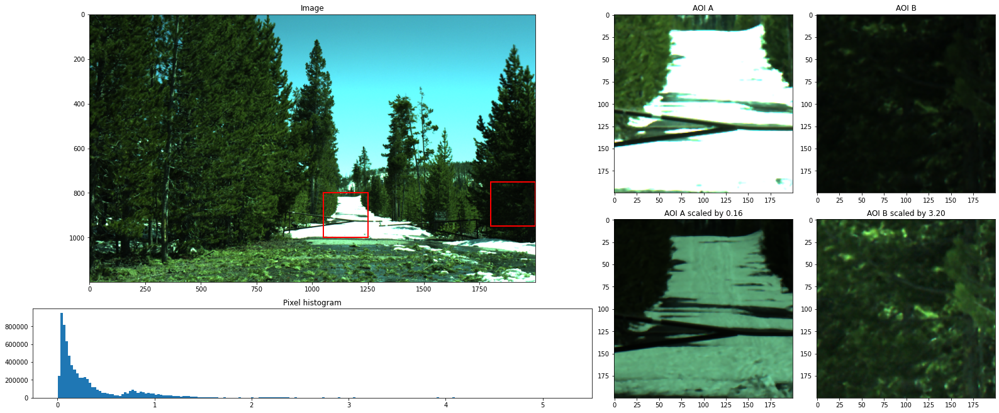

In [ ]:
def show_image_with_2aoi(img, aoi_a_bounds, aoi_b_bounds, scale_a, scale_b):
    m1,m2,n1,n2 = aoi_a_bounds
    aoi_a = img[m1:m2, n1:n2]
    rect_a = patches.Rectangle((n1,m1),n2-n1,m2-m1,linewidth=2,edgecolor='r',facecolor='none')

    m1,m2,n1,n2 = aoi_b_bounds
    aoi_b = img[m1:m2, n1:n2]
    rect_b = patches.Rectangle((n1,m1),n2-n1,m2-m1,linewidth=2,edgecolor='r',facecolor='none')

    fig = plt.figure(figsize=(22,9), constrained_layout=True)
    gs = fig.add_gridspec(4, 10)
    f_ax1 = fig.add_subplot(gs[:3, :6])
    f_ax1.set_title('Image')
    f_ax2 = fig.add_subplot(gs[-1, :6])
    f_ax2.set_title('Pixel histogram')
    f_ax3 = fig.add_subplot(gs[:2, 6:8])
    f_ax3.set_title('AOI A')
    f_ax4 = fig.add_subplot(gs[:2, 8:])
    f_ax4.set_title('AOI B')
    f_ax5 = fig.add_subplot(gs[2:, 6:8])
    f_ax5.set_title('AOI A scaled by {:.2f}'.format(scale_a))
    f_ax6 = fig.add_subplot(gs[2:, 8:])
    f_ax6.set_title('AOI B scaled by {:.2f}'.format(scale_b))

    f_ax1.imshow(img)
    f_ax1.add_patch(rect_a)
    f_ax1.add_patch(rect_b)
    f_ax2.hist(img.flatten(), bins=200)
    f_ax3.imshow(aoi_a)
    f_ax4.imshow(aoi_b)
    f_ax5.imshow(aoi_a*scale_a)
    f_ax6.imshow(aoi_b*scale_b)
    return (fig, (f_ax1, f_ax2, f_ax3, f_ax4, f_ax5, f_ax6))

_ = show_image_with_2aoi(sample_img, *snow_demo_para)

In [ ]:
%%time
# Travers test to find best partition
total_int = 8

partis = []
snrs = []
psnrs = []
ssims = []
for parti in accel_asc(total_int):
    # capture frames
    frames, ts = bundle_capture(parti, sample_img, unit_t, cam)
    # combine and compare
    out, var_est = weighted_combine_frames(frames, ts, cam.sigma_r, cam.sigma_s, OUT_LIM=0.01)
    snr = avg_snr(sample_img, out)
    psnr = cv2.PSNR(sample_img, out, 1.0)
    ssim = structural_similarity(sample_img, out, multichannel=True)
    # print and save
    print("Partition {:<25} gives average snr={:.2f}, psnr={:.2f}, ssim={:.6f}".format("{}".format(parti), snr, psnr, ssim))
    partis.append(parti)
    snrs.append(snr)
    psnrs.append(psnr)
    ssims.append(ssim)
snrs = np.array(snrs)
psnrs = np.array(psnrs)
ssims = np.array(ssims)

ba_ind = np.argmax(snrs)
bp_ind = np.argmax(psnrs)
bs_ind = np.argmax(ssims)
print("")
print("Partition gives best average SNR: partition {}, {}".format(ba_ind, partis[ba_ind]))
print("Partition gives best PSNR: partition {}, {}".format(bp_ind, partis[bp_ind]))
print("Partition gives best SSIM: partition {}, {}".format(bs_ind, partis[bs_ind]))

Partition [1, 1, 1, 1, 1, 1, 1, 1]  gives average snr=37.65, psnr=44.59, ssim=0.994427
Partition [1, 1, 1, 1, 1, 1, 2]     gives average snr=37.74, psnr=44.59, ssim=0.994474
Partition [1, 1, 1, 1, 1, 3]        gives average snr=37.83, psnr=44.41, ssim=0.994495
Partition [1, 1, 1, 1, 2, 2]        gives average snr=37.84, psnr=44.55, ssim=0.994510
Partition [1, 1, 1, 1, 4]           gives average snr=37.90, psnr=44.08, ssim=0.994479
Partition [1, 1, 1, 2, 3]           gives average snr=37.92, psnr=44.34, ssim=0.994534
Partition [1, 1, 1, 5]              gives average snr=37.96, psnr=43.65, ssim=0.994440
Partition [1, 1, 2, 2, 2]           gives average snr=37.91, psnr=44.36, ssim=0.994529
Partition [1, 1, 2, 4]              gives average snr=37.98, psnr=43.93, ssim=0.994500
Partition [1, 1, 3, 3]              gives average snr=37.98, psnr=43.58, ssim=0.994460
Partition [1, 1, 6]                 gives average snr=37.94, psnr=42.54, ssim=0.993512
Partition [1, 2, 2, 3]              gives a

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


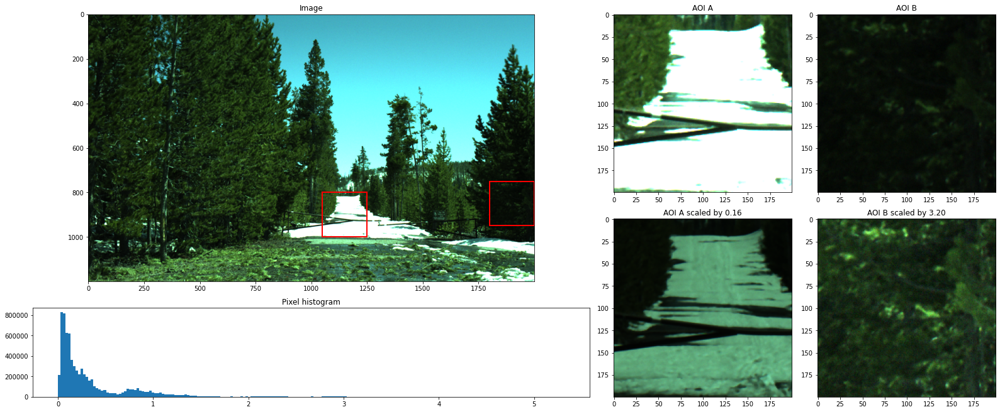

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


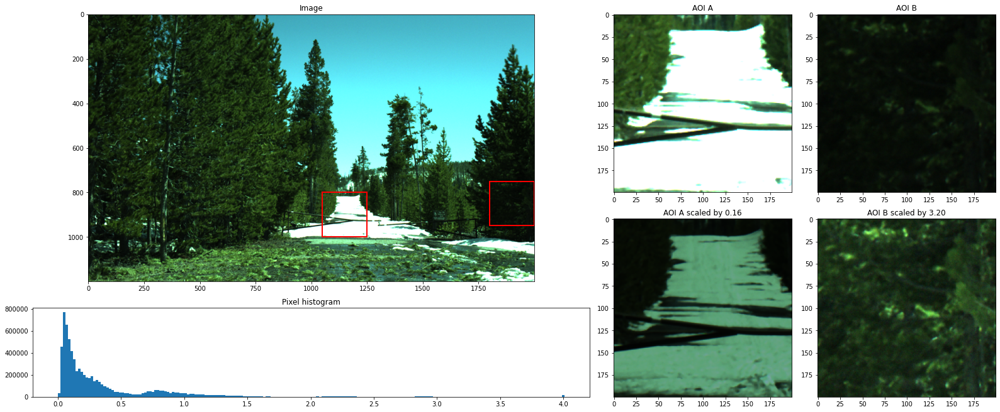

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


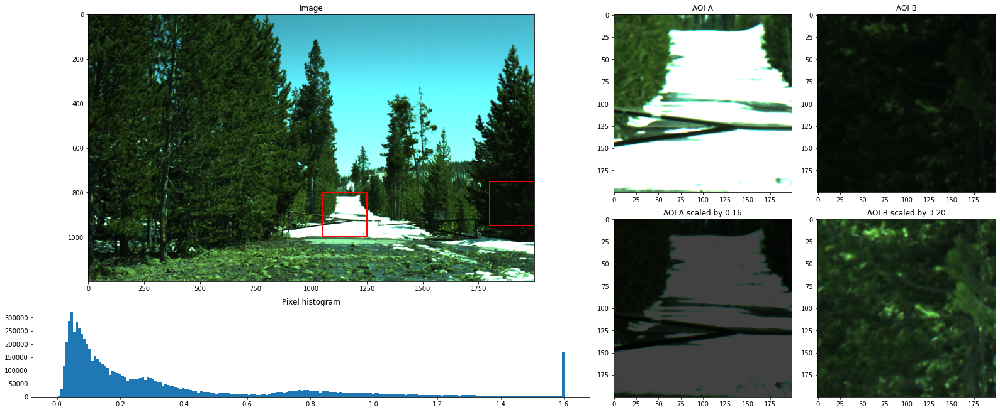

In [ ]:
frames, ts = bundle_capture(partis[ba_ind], sample_img, unit_t, cam)
for f,t in zip(frames,ts):
    _ = show_image_with_2aoi(f/t, *snow_demo_para)
    plt.show()

Best average SNR
CPU times: user 1.62 s, sys: 4.98 ms, total: 1.63 s
Wall time: 1.63 s
CPU times: user 13.1 s, sys: 41.7 ms, total: 13.1 s
Wall time: 13.1 s


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


WC average SNR: 38.0350; MLE average SNR: 38.0364


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


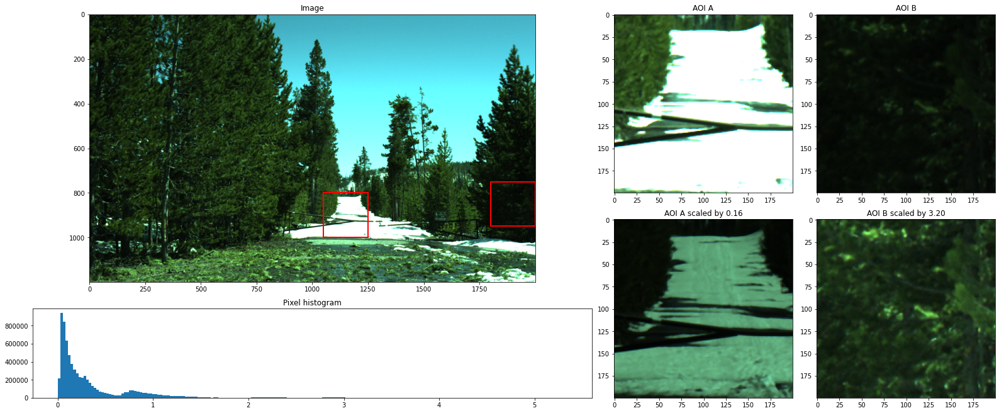

In [ ]:
print("Best average SNR")
frames, ts = bundle_capture(partis[ba_ind], sample_img, unit_t, cam)
%time ba_out, _ = weighted_combine_frames(frames, ts, cam.sigma_r, cam.sigma_s, OUT_LIM=0.01)
%time ba_out_mle = mle_estimate(frames, ts, cam.sigma_r, cam.sigma_s)
print("WC average SNR: {:.4f}; MLE average SNR: {:.4f}".format(avg_snr(sample_img, ba_out), avg_snr(sample_img, ba_out_mle)))
_ = show_image_with_2aoi(ba_out, *snow_demo_para)

Best PSNR


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


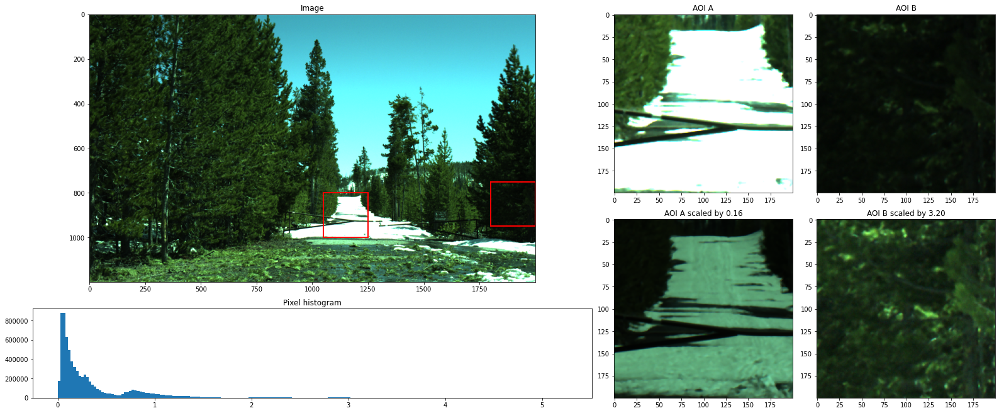

In [ ]:
print("Best PSNR")
frames, ts = bundle_capture(partis[bp_ind], sample_img, unit_t, cam)
bp_out, _ = weighted_combine_frames(frames, ts, cam.sigma_r, cam.sigma_s, OUT_LIM=0.01)
_ = show_image_with_2aoi(bp_out, *snow_demo_para)

Best SSIM


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


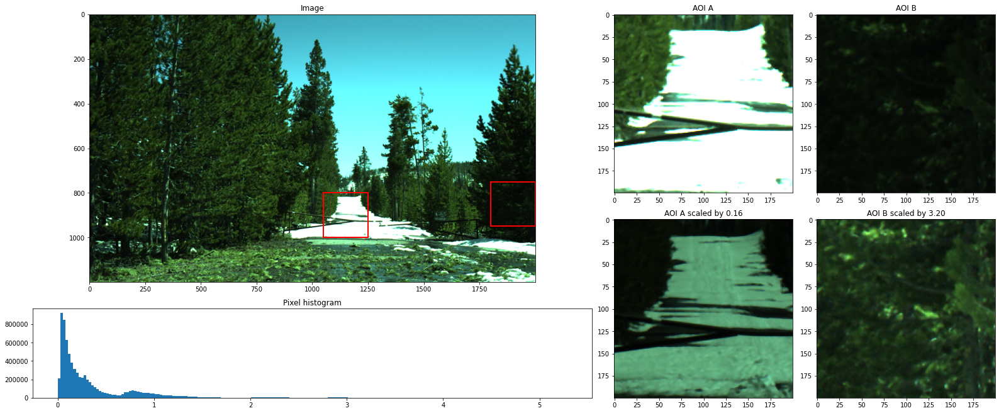

In [ ]:
print("Best SSIM")
frames, ts = bundle_capture(partis[bs_ind], sample_img, unit_t, cam)
bs_out, _ = weighted_combine_frames(frames, ts, cam.sigma_r, cam.sigma_s, OUT_LIM=0.01)
_ = show_image_with_2aoi(bs_out, *snow_demo_para)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


From left to right: gt, average SNR, PSNR, SSIM


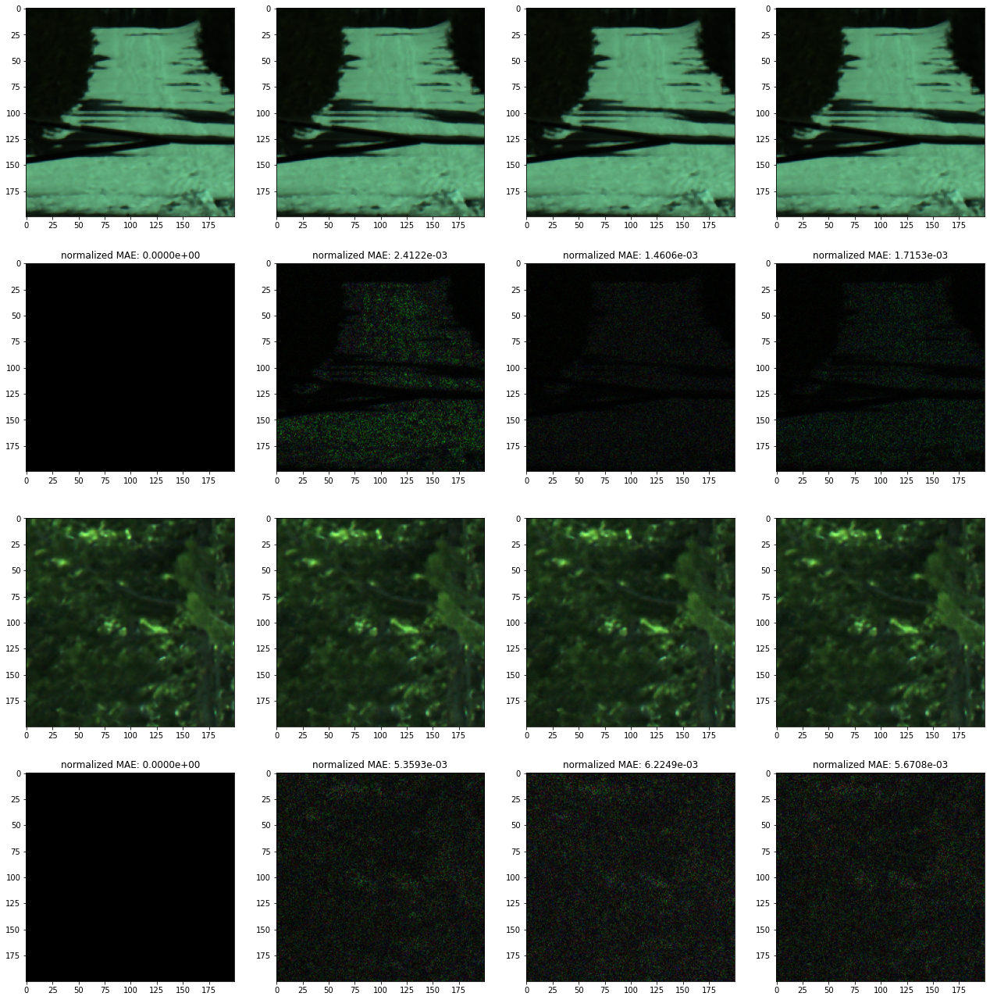

In [ ]:
# compare 3 different method's aoi
print("From left to right: gt, average SNR, PSNR, SSIM")
plt.figure(figsize=(22,23))
for a,img in enumerate([sample_img, ba_out, bp_out, bs_out], 1):
    m1,m2,n1,n2 = aoi_a_bounds
    plt.subplot(4,4,a)
    plt.imshow(img[m1:m2, n1:n2]*scale_a)
    plt.subplot(4,4,4+a)
    plt.imshow(np.abs(img[m1:m2, n1:n2]-sample_img[m1:m2, n1:n2])*scale_a*20)
    plt.title("normalized MAE: {:.4e}".format(np.mean(np.abs(img[m1:m2, n1:n2]-sample_img[m1:m2, n1:n2])*scale_a)))
    m1,m2,n1,n2 = aoi_b_bounds
    plt.subplot(4,4,8+a)
    plt.imshow(img[m1:m2, n1:n2]*scale_b)
    plt.subplot(4,4,12+a)
    plt.imshow(np.abs(img[m1:m2, n1:n2]-sample_img[m1:m2, n1:n2])*scale_b*12)
    plt.title("normalized MAE: {:.4e}".format(np.mean(np.abs(img[m1:m2, n1:n2]-sample_img[m1:m2, n1:n2])*scale_b)))
plt.show()

In [ ]:
stop()
# test fusion methods - different frames
ts = np.array([1,1,2,2], dtype=np.double)/8
frames = []
for t in ts:
    frames.append( cam.exp(sample_img, t, float_out=True) )
frames = np.stack(frames, axis=0)

# combine with different methods
%time std = np.sum(frames, axis=0)/np.sum(ts)
%time wc, var_est = weighted_combine_frames(frames, ts, cam.sigma_r, cam.sigma_s, OUT_LIM=0.01)
%time mle = mle_estimate(frames, ts, cam.sigma_r, cam.sigma_s)

# compare
print("Average SNR \n" + 
      "  simple average: {:.2f}\n".format(avg_snr(sample_img, std)) + 
      "  weighted combine: {:.2f}\n".format(avg_snr(sample_img, wc)) + 
      "  MLE: {:.2f}\n".format(avg_snr(sample_img, mle)))

plt.figure(figsize=(16,10))
plt.imshow(mle)
plt.show()

NameError: ignored

## Appendix: SNR analyse for single pixel with noise model

For one pixel, suppose its ideal response is $\mu$, and its range is [0-1]. Its SNR can be expressed as
$$\begin{aligned}
    \text{SNR} &= \frac{E[S^2]}{E[N^2]} \\
    E[N^2] &= (0-\mu)^2 P(x \le 0)
               + \int_{0}^{1} (x-\mu)^2 PDF(x) dx 
               + (1-\mu)^2 P(x \ge 1) \\
           &= \mu^2 CDF(0)
               + \int_{0}^{1} (x-\mu)^2 PDF(x) dx 
               + (1-\mu)^2 [1-CDF(1)] \\
    PDF(x) &= \frac{1}{\sigma \sqrt{2\pi}} e^{-\frac{1}{2}(\frac{x-\mu}{\sigma})^2} 
            = \frac{1}{\sigma \sqrt{2\pi}} e^{-\frac{(x-\mu)^2}{2\sigma^2}} \\
    CDF(x) &= \frac{1}{2}\bigg[1 + erf\big(\frac{x-\mu}{\sigma \sqrt{2}}\big)\bigg] \\
    \int x^2 PDF(x) dx &= \frac{\sigma^2}{2} erf\big(\frac{x-\mu}{\sigma \sqrt{2}}\big) 
                           -\frac{\sigma (x-\mu)}{\sqrt{2\pi}} e^{-\frac{(x-\mu)^2}{2\sigma^2}} + const\\
                       &= \sigma^2 \frac{1}{2} \bigg[1+erf\big(\frac{x-\mu}{\sigma \sqrt{2}}\big)\bigg] 
                           -\sigma^2 (x-\mu) PDF(x) + const \\
                       &= \sigma^2 \big[CDF(x) - (x-\mu) PDF(x)\big] + const\\
\end{aligned}$$

## Appendix 2: Unused Cells

In [ ]:
plt.figure(figsize=(16,9))
plt.imshow(sample_img)
plt.show()

plt.figure(figsize=(16,9))
plt.imshow(out)
plt.show()

plt.figure(figsize=(16,9))
plt.imshow(np.abs(out-sample_img)/sample_img*5)
plt.show()

plt.figure(figsize=(16,9))
plt.imshow(np.sqrt(var_est)/sample_img*10)
plt.show()

### STRANGE THINGS
More iterations would slightly lower SNR/PSNR, WHY?

In [ ]:
ts = np.array([1,4,16,32,64])/8
frames = []
for t in ts:
    frame = cam.exp(nature_img, t, float_out=True)
    frames.append(frame)
frames = np.stack(frames, axis=0)

ys_hat, vars_hat, ws = weighted_combine_frames(frames, ts, cam.sigma_r, cam.sigma_s, full_out=True, verbose=True, OUT_LIM=1)
print("Average SNR is {:.8f}, psnr is {:.8f}".format(avg_snr(nature_img, ys_hat), cv2.PSNR(nature_img, ys_hat, 1)))

ys_hat, vars_hat, ws = weighted_combine_frames(frames, ts, cam.sigma_r, cam.sigma_s, full_out=True, verbose=True, OUT_LIM=0.01)
print("Average SNR is {:.8f}, psnr is {:.8f}".format(avg_snr(nature_img, ys_hat), cv2.PSNR(nature_img, ys_hat, 1)))

ys_hat, vars_hat, ws = weighted_combine_frames(frames, ts, cam.sigma_r, cam.sigma_s, full_out=True, verbose=True, OUT_LIM=0.00001)
print("Average SNR is {:.8f}, psnr is {:.8f}".format(avg_snr(nature_img, ys_hat), cv2.PSNR(nature_img, ys_hat, 1)))

In [ ]:
ts = np.array([1,4,16,32,64])/8
frames = []
for t in ts:
    frame = cam.exp(nature_img, t, float_out=True)
    frames.append(frame)
frames = np.stack(frames, axis=0)

for a in range(len(ts)):
    ys_hat, vars_hat, ws = weighted_combine_frames(frames[0:a+1], ts[0:a+1], cam.sigma_r, cam.sigma_s, full_out=True, OUT_LIM=0.01)
    print("With {:d} frames, average SNR is {:.4f}, psnr is {:.4f}".format(a+1, avg_snr(nature_img, ys_hat), cv2.PSNR(nature_img, ys_hat, 1)))

In [ ]:
ts = np.array([1,1,1,1,1,1,1,1,1,1])/8
frames = []
for t in ts:
    frame = cam.exp(nature_img, t, float_out=True)
    frames.append(frame)
frames = np.stack(frames, axis=0)

for a in range(len(ts)):
    ys_hat = np.sum(frames[:a+1],axis=0)/(a+1)*8
    print("With {:d} frames, average SNR is {:.4f}, psnr is {:.4f}".format(a+1, avg_snr(nature_img, ys_hat), cv2.PSNR(nature_img, ys_hat, 1)))

In [ ]:
plt.figure(figsize=(16,9))
plt.imshow(np.abs(ys_hat-nature_img)/nature_img*10)
plt.show()

In [ ]:
aoi_dark = (slice(850,1106), slice(750,1006))
aoi_bright = (slice(450,706), slice(-256,None))
for t in np.array([3,40])/8:
    test = cam.exp(nature_img, t, float_out=True)
    plt.figure(figsize=(16,9))
    plt.subplot(1,2,1)
    plt.imshow(test[aoi_dark])
    plt.subplot(1,2,2)
    plt.imshow(test[aoi_bright])
    plt.show()

 <font color="red"> Comments from David Brady. 

 The noise model is great. We need to add a statistical model for the image. Suppose, for example, that the pixel values are gaussian distributed with mean sigma. We seek to set the exposure values that will maximize signal fidelity. We can use adaptive or nonadaptive recording. 

 We assume that pixel has a saturation level, so if we over expose information is lost. 

I don't think that we need to worry about the estimation algorithm at first. The main question is how to deal with saturated pixels, otherwise we could just add the value of each pixel weighted by exposure time over all exposures to get the estimated value. 

The image ideal response is y, the sensor response is h(y), we can assume that 
\begin{equation}
h(y)=
\begin{array}
 yt_ey &\ {\rm for }\  t_ey<y_{sat}\\
y_{sat}&\ {\rm for }\  t_ey>y_{sat}
\end{array}
\end{equation}
where $t_e$ is the exposure time. Our goal is to set the exposure times over the image to enable optimal inversion of the sequence of measurements. If there were no saturation, we simple expose in one exposure for as long as possible. But, because of sat

<font color="blue"> Reply and thoughts by Minghao, Dec 29

Your method is exactly the same as mine for single pixel exposure. Once we have an estimation of the pixel's normalized ideal response, we can set an exposure time that makes it *almost saturated*.

The hard part is to consider the whole frame, where we may saturate some brighter pixels to better measure for dark pixels, or let darker pixels be around 0 to better measure bright pixels. Thus we need to quantize the contributions of each measurement, then find a optimal one.

I tried to analyze the estimation algorithm to find out how an estimation contributes to final output, but I seems to make things too complex. I'll give a rough but much simpler version, which is what I originally thought. You can find it in section "Frame Fusion 0: weighted average".

For the saturated pixels, I think they should be ignored when estimating output. As you said, the information is lost. Including them would introduce bias, which is bad.   
As long as there's a non-saturated pixel, the saturated pixels should be abandoned; if there's none, then they should work as an mask for image inpainting.

I've searched papers about statistical model for the image, but didn't find proper ones. Most of the papers normalize the images, then works on fancy topics like power spectrum or wavelet. I'm not sure how these statistic features can help our project.